# LOS ANGELES CRIME

## Import libraries

In [181]:
import pandas as pd
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import requests

## Import data

In [127]:
url = "https://data.lacity.org/resource/2nrs-mtv8.csv?$select=*&$limit=764061&$offset=0"

response = requests.get(url)
# Verificar si la solicitud fue exitosa (código de estado 200)
if str(response.status_code).startswith('2'):
    # Guardar el contenido en un archivo CSV
    with open("../data/raw/crime_data.csv", "wb") as f:
        f.write(response.content)
else:
    print(f"Error al realizar la solicitud: {response.status_code}")

In [152]:
total_data = pd.read_csv("../data/raw/crime_data.csv")

## Exploration and data cleaning

In [ ]:
total_data.head(5)

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,part_1_2,crm_cd,crm_cd_desc,mocodes,vict_age,vict_sex,vict_descent,premis_cd,premis_desc,weapon_used_cd,weapon_desc,status,status_desc,crm_cd_1,crm_cd_2,crm_cd_3,crm_cd_4,location,cross_street,lat,lon
0,10304468,2020-01-08T00:00:00.000,2020-01-08T00:00:00.000,2230,3,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,0444 0913,36,F,B,501.0,SINGLE FAMILY DWELLING,400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",AO,Adult Other,624.0,NaN,NaN,NaN,1100 W 39TH PL,NaN,34.0141,-118.2978
1,190101086,2020-01-02T00:00:00.000,2020-01-01T00:00:00.000,330,1,Central,163,2,624,BATTERY - SIMPLE ASSAULT,0416 1822 1414,25,M,H,102.0,SIDEWALK,500.0,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,624.0,NaN,NaN,NaN,700 S HILL ST,NaN,34.0459,-118.2545
2,200110444,2020-04-14T00:00:00.000,2020-02-13T00:00:00.000,1200,1,Central,155,2,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,1501,0,X,X,726.0,POLICE FACILITY,NaN,NaN,AA,Adult Arrest,845.0,NaN,NaN,NaN,200 E 6TH ST,NaN,34.0448,-118.2474
3,191501505,2020-01-01T00:00:00.000,2020-01-01T00:00:00.000,1730,15,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),0329 1402,76,F,W,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NaN,NaN,IC,Invest Cont,745.0,998.0,NaN,NaN,5400 CORTEEN PL,NaN,34.1685,-118.4019
4,191921269,2020-01-01T00:00:00.000,2020-01-01T00:00:00.000,415,19,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)",0329,31,X,X,409.0,BEAUTY SUPPLY STORE,NaN,NaN,IC,Invest Cont,740.0,NaN,NaN,NaN,14400 TITUS ST,NaN,34.2198,-118.4468


In [153]:
total_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 764061 entries, 0 to 764060
Data columns (total 28 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   dr_no           764061 non-null  int64  
 1   date_rptd       764061 non-null  object 
 2   date_occ        764061 non-null  object 
 3   time_occ        764061 non-null  int64  
 4   area            764061 non-null  int64  
 5   area_name       764061 non-null  object 
 6   rpt_dist_no     764061 non-null  int64  
 7   part_1_2        764061 non-null  int64  
 8   crm_cd          764061 non-null  int64  
 9   crm_cd_desc     764061 non-null  object 
 10  mocodes         662300 non-null  object 
 11  vict_age        764061 non-null  int64  
 12  vict_sex        669514 non-null  object 
 13  vict_descent    669503 non-null  object 
 14  premis_cd       764041 non-null  float64
 15  premis_desc     763579 non-null  object 
 16  weapon_used_cd  263469 non-null  float64
 17  weapon_des

### Count and eliminate duplicates

In [154]:
duplicate_count = total_data.duplicated().sum()
duplicate_count

171895

In [155]:
total_data.drop_duplicates(inplace= True)
total_data.shape

(592166, 28)

In [156]:
total_data.head(2)

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,part_1_2,crm_cd,crm_cd_desc,...,status,status_desc,crm_cd_1,crm_cd_2,crm_cd_3,crm_cd_4,location,cross_street,lat,lon
0,10304468,2020-01-08T00:00:00.000,2020-01-08T00:00:00.000,2230,3,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,...,AO,Adult Other,624.0,NaN,NaN,NaN,1100 W 39TH PL,NaN,34.0141,-118.2978
1,190101086,2020-01-02T00:00:00.000,2020-01-01T00:00:00.000,330,1,Central,163,2,624,BATTERY - SIMPLE ASSAULT,...,IC,Invest Cont,624.0,NaN,NaN,NaN,700 S HILL ST,NaN,34.0459,-118.2545


In [157]:
total_data["date_occ"] = pd.to_datetime(total_data["date_occ"], format="%Y-%m-%dT%H:%M:%S.%f").dt.strftime("%Y-%m-%d")
total_data["date_occ"] = pd.to_datetime(total_data["date_occ"])
total_data["date_rptd"] = pd.to_datetime(total_data["date_rptd"], format="%Y-%m-%dT%H:%M:%S.%f").dt.strftime("%Y-%m-%d")
total_data["date_rptd"] = pd.to_datetime(total_data["date_rptd"])
total_data["time_occ"] = pd.to_datetime(total_data["time_occ"].astype(str), format="%H%M", errors="coerce").dt.time
total_data.head(5)

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,part_1_2,crm_cd,crm_cd_desc,...,status,status_desc,crm_cd_1,crm_cd_2,crm_cd_3,crm_cd_4,location,cross_street,lat,lon
0,10304468,2020-01-08,2020-01-08,22:30:00,3,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,...,AO,Adult Other,624.0,NaN,NaN,NaN,1100 W 39TH PL,NaN,34.0141,-118.2978
1,190101086,2020-01-02,2020-01-01,03:30:00,1,Central,163,2,624,BATTERY - SIMPLE ASSAULT,...,IC,Invest Cont,624.0,NaN,NaN,NaN,700 S HILL ST,NaN,34.0459,-118.2545
2,200110444,2020-04-14,2020-02-13,12:00:00,1,Central,155,2,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,...,AA,Adult Arrest,845.0,NaN,NaN,NaN,200 E 6TH ST,NaN,34.0448,-118.2474
3,191501505,2020-01-01,2020-01-01,17:30:00,15,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),...,IC,Invest Cont,745.0,998.0,NaN,NaN,5400 CORTEEN PL,NaN,34.1685,-118.4019
4,191921269,2020-01-01,2020-01-01,04:15:00,19,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",...,IC,Invest Cont,740.0,NaN,NaN,NaN,14400 TITUS ST,NaN,34.2198,-118.4468


In [158]:
total_data["weekday"] = total_data["date_occ"].dt.dayofweek.map({
    0: 'Monday',
    1: 'Tuesday',
    2: 'Wednesday',
    3: 'Thursday',
    4: 'Friday',
    5: 'Saturday',
    6: 'Sunday'
})

In [159]:
total_data.head(2)

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,part_1_2,crm_cd,crm_cd_desc,...,status_desc,crm_cd_1,crm_cd_2,crm_cd_3,crm_cd_4,location,cross_street,lat,lon,weekday
0,10304468,2020-01-08,2020-01-08,22:30:00,3,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,...,Adult Other,624.0,NaN,NaN,NaN,1100 W 39TH PL,NaN,34.0141,-118.2978,Wednesday
1,190101086,2020-01-02,2020-01-01,03:30:00,1,Central,163,2,624,BATTERY - SIMPLE ASSAULT,...,Invest Cont,624.0,NaN,NaN,NaN,700 S HILL ST,NaN,34.0459,-118.2545,Wednesday


In [160]:
total_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 592166 entries, 0 to 764060
Data columns (total 29 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   dr_no           592166 non-null  int64         
 1   date_rptd       592166 non-null  datetime64[ns]
 2   date_occ        592166 non-null  datetime64[ns]
 3   time_occ        579595 non-null  object        
 4   area            592166 non-null  int64         
 5   area_name       592166 non-null  object        
 6   rpt_dist_no     592166 non-null  int64         
 7   part_1_2        592166 non-null  int64         
 8   crm_cd          592166 non-null  int64         
 9   crm_cd_desc     592166 non-null  object        
 10  mocodes         515210 non-null  object        
 11  vict_age        592166 non-null  int64         
 12  vict_sex        521042 non-null  object        
 13  vict_descent    521035 non-null  object        
 14  premis_cd       592148 non-null  float64 

## Eliminate irrelevant information

In [161]:
total_data["date_occ"].dt.year.value_counts()

date_occ
2023    228067
2021    106521
2011     98252
2010     58825
2022     56133
2020     44368
Name: count, dtype: int64

In [162]:
total_data = total_data.loc[(total_data["date_occ"].dt.year != 2010) & (total_data["date_occ"].dt.year != 2011)]

In [163]:
total_data["date_occ"].dt.year.value_counts()

date_occ
2023    228067
2021    106521
2022     56133
2020     44368
Name: count, dtype: int64

In [165]:
total_data.columns

Index(['dr_no', 'date_rptd', 'date_occ', 'time_occ', 'area', 'area_name',
       'rpt_dist_no', 'part_1_2', 'crm_cd', 'crm_cd_desc', 'mocodes',
       'vict_age', 'vict_sex', 'vict_descent', 'premis_cd', 'premis_desc',
       'weapon_used_cd', 'weapon_desc', 'status', 'status_desc', 'crm_cd_1',
       'crm_cd_2', 'crm_cd_3', 'crm_cd_4', 'location', 'cross_street', 'lat',
       'lon', 'weekday'],
      dtype='object')

In [166]:
drop_columns = ['dr_no', 'date_rptd', 'area',
       'part_1_2', 'crm_cd', 'premis_cd', 'weapon_used_cd', 'status', 'crm_cd_1',
       'crm_cd_2', 'crm_cd_3', 'crm_cd_4', 'cross_street']

In [167]:
total_data.drop(drop_columns, axis=1, inplace=True)
total_data.head(2)

,date_occ,time_occ,area_name,rpt_dist_no,crm_cd_desc,mocodes,vict_age,vict_sex,vict_descent,premis_desc,weapon_desc,status_desc,location,lat,lon,weekday
0,2020-01-08,22:30:00,Southwest,377,BATTERY - SIMPLE ASSAULT,0444 0913,36,F,B,SINGLE FAMILY DWELLING,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",Adult Other,1100 W 39TH PL,34.0141,-118.2978,Wednesday
1,2020-01-01,03:30:00,Central,163,BATTERY - SIMPLE ASSAULT,0416 1822 1414,25,M,H,SIDEWALK,UNKNOWN WEAPON/OTHER WEAPON,Invest Cont,700 S HILL ST,34.0459,-118.2545,Wednesday


In [180]:
columns = total_data.columns
columns

Index(['date_occ', 'time_occ', 'area_name', 'rpt_dist_no', 'crm_cd_desc',
       'mocodes', 'vict_age', 'vict_sex', 'vict_descent', 'premis_desc',
       'weapon_desc', 'status_desc', 'location', 'lat', 'lon', 'weekday'],
      dtype='object')

## Analysis of univariate variables

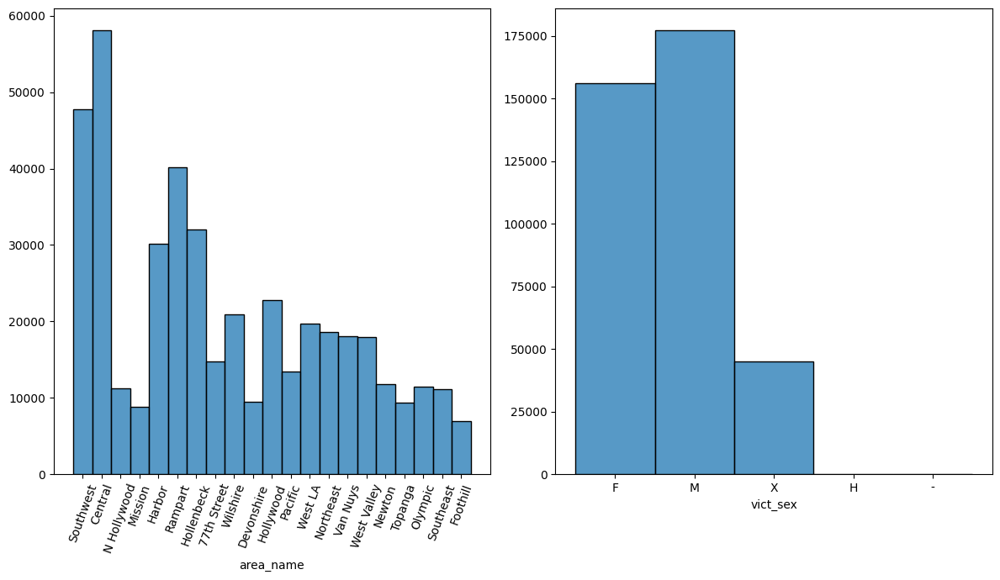

In [182]:
fig, axis = plt.subplots(1,2, figsize = (12, 7))

# Crear un histograma múltiple
sns.histplot(ax = axis[0], data = total_data, x = "area_name").set(ylabel = None) 
axis[0].tick_params(axis='x', rotation=70)

sns.histplot(ax = axis[1], data = total_data, x = "vict_sex").set(ylabel = None)


# Ajustar el layout
plt.tight_layout()

# Mostrar el plot
plt.show()

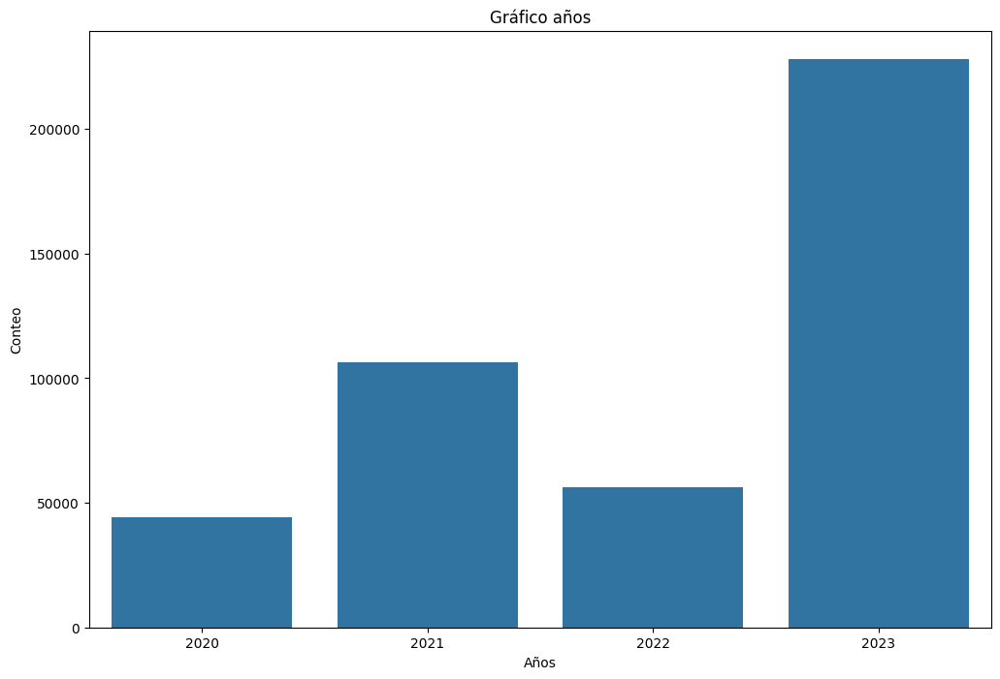

In [193]:
plt.figure(figsize=(12, 8))

# Crear el histograma utilizando Seaborn
ax=sns.barplot(x=total_data["date_occ"].dt.year.value_counts().index, 
                 y=total_data["date_occ"].dt.year.value_counts())

# Configurar etiquetas y título
plt.xlabel('Años')
plt.ylabel('Conteo')
plt.title('Gráfico años')

# Mostrar el gráfico
plt.show()

In [194]:
delitos=total_data.value_counts("crm_cd_desc")[0:20]
delitos=pd.DataFrame(delitos)
delitos

,count
crm_cd_desc,
VEHICLE - STOLEN,46010
BATTERY - SIMPLE ASSAULT,37114
BURGLARY FROM VEHICLE,28211
"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)",27159
"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",25731
BURGLARY,24850
THEFT OF IDENTITY,22780
THEFT PLAIN - PETTY ($950 & UNDER),22118
INTIMATE PARTNER - SIMPLE ASSAULT,21098


C:\Users\luisf\AppData\Local\Temp\ipykernel_14760\406058030.py:5: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


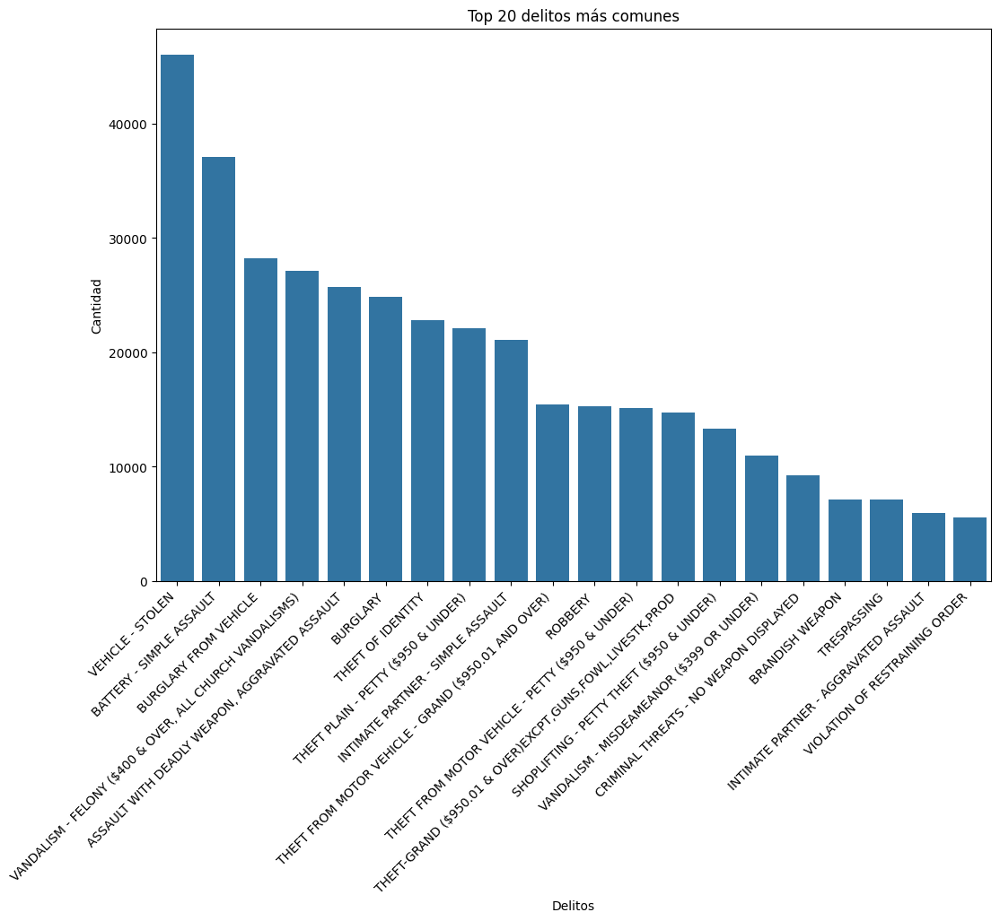

In [195]:
plt.figure(figsize=(12, 8))

# Crear el histograma utilizando Seaborn
ax=sns.barplot(x=delitos.index, y=delitos['count'], data=delitos)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

# Configurar etiquetas y título
plt.xlabel('Delitos')
plt.ylabel('Cantidad')
plt.title('Top 20 delitos más comunes')

# Mostrar el gráfico
plt.show()

In [196]:
hours=total_data.value_counts("time_occ")[0:20]
hours=pd.DataFrame(hours)
hours

,count
time_occ,
20:00:00,14670
12:00:00,13895
10:00:00,12081
18:00:00,11357
17:00:00,10609
22:00:00,10256
21:00:00,9827
19:00:00,9753
23:00:00,9510


In [197]:
hours=hours.sort_index()

C:\Users\luisf\AppData\Local\Temp\ipykernel_14760\1466943065.py:5: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


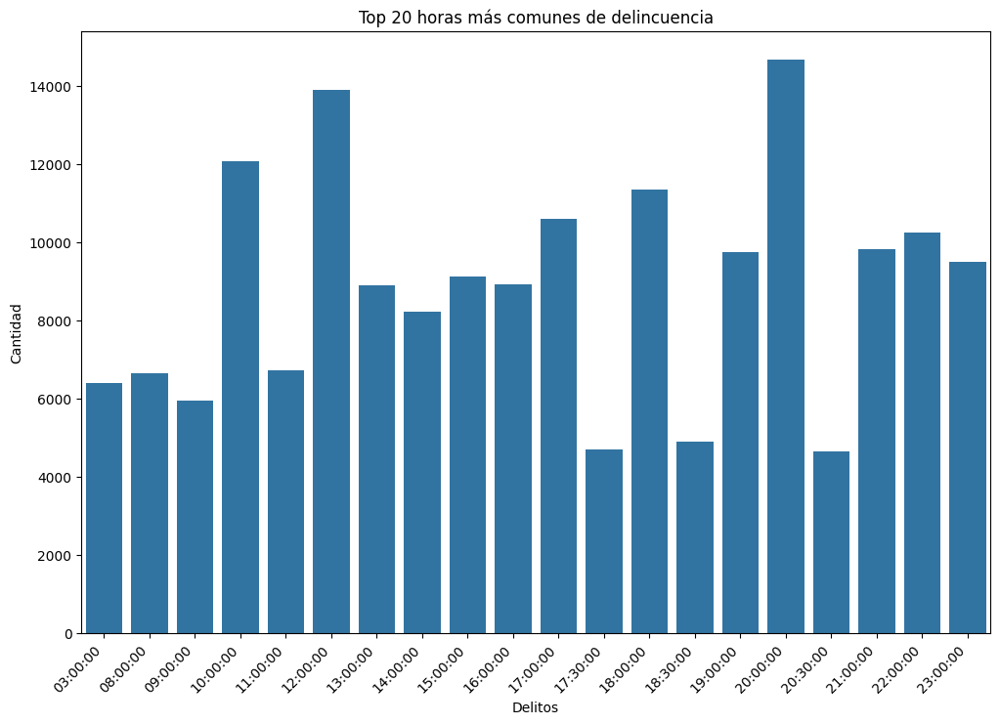

In [199]:
plt.figure(figsize=(12, 8))

# Crear el histograma utilizando Seaborn
ax=sns.barplot(x=hours.index, y=hours['count'], data=hours)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

# Configurar etiquetas y título
plt.xlabel('Delitos')
plt.ylabel('Cantidad')
plt.title('Top 20 horas más comunes de delincuencia')

# Mostrar el gráfico
plt.show()

In [201]:
rpt_codes=total_data.value_counts("rpt_dist_no")[0:20]
rpt_codes=pd.DataFrame(rpt_codes)
rpt_codes

,count
rpt_dist_no,
162,4556
182,4032
111,3305
152,2617
153,2549
119,2521
245,2300
185,2289
363,2284


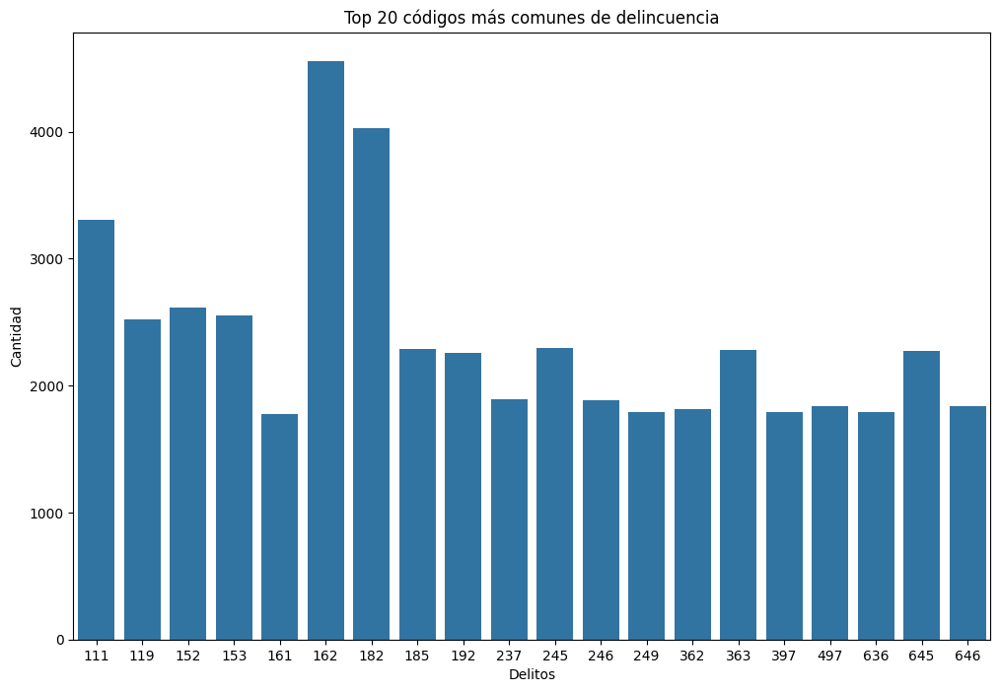

In [202]:
plt.figure(figsize=(12, 8))

# Crear el histograma utilizando Seaborn
ax=sns.barplot(x=rpt_codes.index, y=rpt_codes['count'], data=rpt_codes)
#ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

# Configurar etiquetas y título
plt.xlabel('Delitos')
plt.ylabel('Cantidad')
plt.title('Top 20 códigos más comunes de delincuencia')

# Mostrar el gráfico
plt.show()

In [203]:
total_data.iloc[8000]

date_occ                            2020-09-07 00:00:00
time_occ                                       20:00:00
area_name                                     Southwest
rpt_dist_no                                         335
crm_cd_desc       INTIMATE PARTNER - AGGRAVATED ASSAULT
mocodes         2000 0913 0334 0416 0449 1814 1218 0445
vict_age                                             25
vict_sex                                              F
vict_descent                                          H
premis_desc                                      STREET
weapon_desc                             PIPE/METAL PIPE
status_desc                                 Adult Other
location        2800 W  JEFFERSON                    BL
lat                                             34.0276
lon                                           -118.3229
weekday                                          Monday
Name: 8003, dtype: object

In [204]:
ages=total_data.value_counts("vict_age")[0:20]
ages

vict_age
0     111210
30      9978
31      9593
29      9583
28      9294
32      9182
27      9179
33      9037
35      8998
22      8606
25      8605
26      8585
34      8489
24      8248
36      7886
37      7559
38      7397
23      7253
21      7218
39      6969
Name: count, dtype: int64

In [205]:
for i in total_data['mocodes']:
    # if type(i)==float:
    #     print(i)
    print(i)

0444 0913
0416 1822 1414
1501
0329 1402
0329
0413 1822 1262 1415
1402 2004 0344 0387
1402 0392
1822 0344 1402
1822 1414 0344 1307
0421 0906
1822 0344 2032
1402 1501 2004
0325 1402 0344 1822
0319 0344 0429 0448 0305
0416 0411 0344 1822 0305 0334 2004 1414 1202 1218
0344 1822 2032
0325 1402 0907
0416 0913 2004 1218
2004 0305 0411 1202 1414 1402 1822 0906
1414 1402 1415 0444 0527 0537 0400 0507 1822
1402 1822 1414 0344
nan
1402 0910 0444 0443 0334 1202 1822 2051 2049
0329 1300 1822 1414 1420
0344 1414
0344 1605 1611 1822 0385 0321
0947 0913 0416 0447 1402 0319 0443 1420 2004
0416 2004 1822 1402
0344 1402
1310 1307 0329 1402
1822 0334 0319 0416 0400 1402 1309 0216
2004 0344 0378
0329
2000 0913 0416 1813 1243
0344 0416 0446 1822
0329
0416 0421 1822
0416 2000
0344 1822 1414 1605
1218 1822 0910 0522 0408 0448 2015 1000
0337 0340 0416 0445 1822 1218 2021 1019
0329
1822 2032 0344
0329 1218
0416 0446 0408 2000 1814 0913 0216 1309 0329
2004 1212 0917 0910 1822 0417 2048
2004 1212 0917 0910 1822 0

In [206]:
total_data['mocodes'] = total_data['mocodes'].astype(str)

In [207]:
total_data['mocodes'] = total_data['mocodes'].apply(lambda x: x.split(' '))

In [208]:
total_data['mocodes']

0                           [0444, 0913]
1                     [0416, 1822, 1414]
2                                 [1501]
3                           [0329, 1402]
4                                 [0329]
                       ...              
764039                [1300, 1307, 0344]
764051                      [0529, 2004]
764053          [0448, 0913, 1813, 2000]
764058                      [1822, 0344]
764060    [1822, 1606, 0344, 0385, 1300]
Name: mocodes, Length: 435089, dtype: object

In [209]:
mocodes_df = pd.concat([total_data['mocodes'].apply(lambda x: pd.Series(x))], axis=1)

In [210]:
mocodes_df

,0,1,2,3,4,5,6,7,8,9
0,0444,0913,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0416,1822,1414,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1501,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0329,1402,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0329,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
764039,1300,1307,0344,NaN,NaN,NaN,NaN,NaN,NaN,NaN
764051,0529,2004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
764053,0448,0913,1813,2000,NaN,NaN,NaN,NaN,NaN,NaN
764058,1822,0344,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
import PyPDF2

with open(r'..\data\raw\MO_CODES_Numerical_20191119.pdf', 'rb') as file:
    reader = PyPDF2.PdfReader(file)
    text = ''
    for page_num in range(len(reader.pages)):
        text += reader.pages[page_num].extract_text()

# Dividir el texto en líneas
lines = text.split('\n')

# Crear un DataFrame
df = pd.DataFrame({'Text': lines})

# Muestra las primeras filas del DataFrame
print(df.head())

                       Text
0                REV: 07/19
1  0100 Suspect Impersonate
2           0101 Aid victim
3                0102 Blind
4  0103 Physically disabled
